<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro_pt1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import sys
import IPython.core.display
from pathlib import Path
import pickle
import re
import phik
from sklearn.linear_model import LinearRegression, ElasticNet, Ridge, Lasso
from sklearn.metrics import r2_score, mean_squared_error as MSE
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from itertools import chain, combinations
from functools import partial
from sklearn.base import BaseEstimator, RegressorMixin, TransformerMixin
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Патч: добавляем функцию display обратно в старое место
sys.modules['IPython.core.display'].display = IPython.display.display # Баг в ydata_profiling моей версии, который не позволяет использовать display по-умолчанию

# Теперь импортируем профилировщик
from ydata_profiling import ProfileReport

random.seed(42)
np.random.seed(42)

In [2]:
save_model_path = Path('./models/')

def save(model, name: str):
    name = name + '.pkl'
    if not save_model_path.exists():
        save_model_path.mkdir()
    with open(save_model_path / name, 'wb') as f:
        pickle.dump(model, f)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

> С целью фиксации повторяемости экспериментов: каждый раз, используя случайные величины, мы можем быть уверены, что они примут одно и то же значение

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [4]:
for i in range(0, len(df_train)):
  try:
    ffil_value = float(df_train.loc[i, 'max_power'][:-4])
    df_train.loc[i, 'max_power'] = ffil_value

  except:
    if df_train.loc[i, 'max_power'] in [np.nan, 'nan']:
      continue
    elif df_train.loc[i, 'max_power'] == '0':
      ffil_value = float(df_train.loc[i, 'max_power'])
      df_train.loc[i, 'max_power'] = ffil_value
    else:
      df_train.loc[i, 'max_power'] = 0


In [5]:
df_train.duplicated().sum()

np.int64(985)

In [6]:
def print_wrong_data(df: pd.DataFrame):
    print("Количество дубликатов:")
    print("\n".join(f"{col}: {df[col].duplicated().sum()}" for col in df.columns))
    print("Количество явных дубликатов:", df.duplicated().sum())
    print("Количество пропусков по столбцам:")
    print( df.isna().sum())

print("Информация по данным обучения:")
print_wrong_data(df_train)
print("="*20)
print("Информация по данным теста:")
print_wrong_data(df_test)

Информация по данным обучения:
Количество дубликатов:
name: 5075
year: 6970
selling_price: 6362
km_driven: 6172
fuel: 6995
seller_type: 6996
transmission: 6997
owner: 6994
mileage: 6612
engine: 6878
max_power: 6685
torque: 6579
seats: 6989
Количество явных дубликатов: 985
Количество пропусков по столбцам:
name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64
Информация по данным теста:
Количество дубликатов:
name: 379
year: 976
selling_price: 726
km_driven: 740
fuel: 996
seller_type: 997
transmission: 998
owner: 995
mileage: 762
engine: 911
max_power: 817
torque: 773
seats: 993
Количество явных дубликатов: 62
Количество пропусков по столбцам:
name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type      

In [7]:
profile = ProfileReport(df_train, title="Profiling Report (train)")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile_test = ProfileReport(df_test, title="Profiling Report (test)")
profile


> Выводы:
> 1. Имеем 4 категориальных признака, 5 вещественных и 4 текстовых переменных.
> 2. Наблюдается корреляция: сильная отрицательная между годом автомобиля и пробегом, средне-слабой отрицательной между ценой продажи и пробегом, значительной корреляцией между максимальной мощностью и типом топлива/трансмиссией/ценой продажи.
> 3. В `mileage`, `engine`, `max_power`, `torque` и `seats` есть пропуски (`Missing`).

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [10]:
# 1. Основные статистики по числовым столбцам
print("=== Статистики по числовым признакам (Train) ===")
print(df_train.describe())

print("=== Статистики по числовым признакам (Test) ===")
print(df_test.describe())

print('\n\n')

print("=== Статистики по категориальным признакам (Train) ===")
print(df_train.describe(include='object'))

print("=== Статистики по категориальным признакам (Test) ===")
print(df_test.describe(include='object'))

=== Статистики по числовым признакам (Train) ===
              year  selling_price     km_driven        seats
count  6999.000000   6.999000e+03  6.999000e+03  6797.000000
mean   2013.818403   6.395152e+05  6.958462e+04     5.419008
std       4.053095   8.089419e+05  5.772400e+04     0.965767
min    1983.000000   2.999900e+04  1.000000e+00     2.000000
25%    2011.000000   2.549990e+05  3.500000e+04     5.000000
50%    2015.000000   4.500000e+05  6.000000e+04     5.000000
75%    2017.000000   6.750000e+05  9.700000e+04     5.000000
max    2020.000000   1.000000e+07  2.360457e+06    14.000000
=== Статистики по числовым признакам (Test) ===
              year  selling_price      km_driven       seats
count  1000.000000   1.000000e+03    1000.000000  981.000000
mean   2013.681000   6.179010e+05   71393.341000    5.410805
std       4.012149   7.585539e+05   48486.218662    0.919985
min    1995.000000   3.100000e+04    1303.000000    4.000000
25%    2011.000000   2.500000e+05   37000.000000 

> Сравнение среднего/медиан:
> 1. В трейне имеем, что среднее по году выпуска меньше медианы - вероятно, мы имеем значимое количество машин со старым годом выпуска (min: 1983, тогда как max: 2020). Т.о. получаем асимметричное распределение. Аналогичная ситуация и в тесте.
> 2. Цена продажи: среднее значительно больше медианы, что значит у нас есть машины "премиум" сегмента (высокой цены), но при этом их не так много (иначе бы медиана была больше). Также асимметричное распределение. Аналогично и в тесте.
> 3. Пробег: также среднее выше медианы, что согласуется с пунктом `1.` - очень старые машины имеют очень большой пробег. Асимметричное распределение.Похожая ситуация и в тесте, но только разрыв менее ярковыраженный.
> 4. Кол-во мест: среднее примерно схоже с медианой, что означает в целом мы имеем дело с пятиместной машиной. Вероятно симметричное распределение. Аналогично и в тесте.
> Если говорить про статистики между трейном и тестом, то:
> 1. Год выпуска: средние можно сказать равны, медианы различаются на год => в трейне больше новых автомобилей.
> 2. Цена продажи: средние и медиана примерно равны в обоих датасетах.
> 3. Пробег: в среднем пробег автомобилей в тесте больше, чем в трейне, при этом медианы примерно равны => в тесте у нас есть автомобили с очень высоким пробегом (это может быть также обусловлено количеством данных, поскольку статистика среднего очень сильно зависит от кол-ва наблюдений).
> 4. Кол-во мест одинаково в общем-то.
> 
> По остальным статистикам (базово):
> 
> - Важно обратить внимание на количество уникальных значений в наших категориальных переменных и их совпадение между трейном и тестом - возможно, нам понадобится их кодировать методом OHE и тогда несовпадение по количеству (а также по самим значениям) может привести к некорректным результатам при формировании кодировщика на основе лишь только трейна.
> - Из интересного: продавцы преимущественно частники, наиболее распространенная трансмиссия - ручная.
> - Вероятные выбросы: В трейне максимальный пробег достигает 2.36 млн км, в то время как 75% машин имеют пробег до 97 тыс. км. (разница 2 порядка)
> - Итого имеем достаточно хороший датасет, который, однако, нужно будет предобработать.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [11]:
feature_cols = df_train.columns.drop('selling_price')

# Дубликатом считаем все повторяющиеся строки
num_duplicates = df_train.duplicated(subset=feature_cols, keep=False).sum()

print(f"Количество дубликатов по признакам: {num_duplicates}")

duplicates = df_train[df_train.duplicated(subset=feature_cols, keep=False)]
duplicates.head()

Количество дубликатов по признакам: 1799


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35.0,6.1kgm@ 3000rpm,5.0


In [12]:
# Удалим повторяющиеся строки
df_train = df_train.drop_duplicates(subset=feature_cols, keep='first')

In [13]:
assert df_train.shape == (5840, 13)

> Возможные дубликаты:
> 1. В текстовых столбцах у нас могут быть дубликаты по логике, но не по значению: например, текст, отличающийся лишь регистром, либо текст, имеющий лишние незначимые символы (пробелы/табуляции и т.д.), а также отличающийся лишь кодированием  (UTF-8 vs Windows и т.д.). Такое можно обрабатывать предварительной нормализацией текста - приведением его к единому регистру, удалению не имеющих значения спецсимволов и т.п.
> 2. В числовых (если нам важно искать их там по какой-то причине) у нас могут быть скрытые дубликаты, вызванные ошибкой округления/вычислительными проблемами, например, 1e-30 не будет равен 0, хотя, конечно, нам будет казаться это именно дубликатом. Решение: приведение числовых значений к единому округлению (например, до 5 знаков после запятой). Также дубликаты, связанные с разными единицами измерения.
> 3. Антипример: дублями, вообще говоря, не должны являться NaN значения, поскольку это не какое-то значение, а его отсутствие. В целом все библиотеки анализа выдают `False` при сравнении NaN значений, поэтому это не проблема, но стоит помнить, если мы, например, реализуем какую-то собственную библиотеку.

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [14]:
df_train.head(2)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74.0,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,250Nm@ 1500-2500rpm,5.0


In [15]:
def clean_measurement_unit(df: pd.DataFrame, cols: list[str]):
    df = df.copy()
    for col in cols:
         df[col] = df[col].astype(str).str.split(expand=True)[0].astype(float)
    # df = df.astype({col: 'float32' for col in cols})
    return df

In [16]:
df_train = clean_measurement_unit(df_train, ["mileage", "engine", "max_power"])
df_test = clean_measurement_unit(df_test, ["mileage", "engine", "max_power"])

In [17]:
# Функция сделала с любовью и использованием Gemini 3 Pro
def parse_torque_robust(x):
    if pd.isna(x):
        return pd.Series([np.nan, np.nan])
        
    x_clean = str(x).lower().replace(',', '') # Remove commas (4,500 -> 4500)
    
    # Detect unit
    multiplier = 1.0
    if 'kgm' in x_clean:
        multiplier = 9.80665
    
    # Clean up to help regex
    # Replace 'at', '/' with '@' to have a standard separator
    x_clean = x_clean.replace('at', '@').replace('/', '@')
    
    parts = x_clean.split('@')
    
    torque_val = np.nan
    rpm_val = np.nan
    
    # Try to find torque in the first part
    if len(parts) > 0:
        # Find first float number
        t_match = re.search(r'([\d\.]+)', parts[0])
        if t_match:
            try:
                torque_val = float(t_match.group(1)) * multiplier
            except:
                pass
                
    # Try to find rpm in the second part (or subsequent parts if multiple @)
    if len(parts) > 1:
        rpm_part = " ".join(parts[1:]) 
        r_matches = re.findall(r'([\d\.]+)', rpm_part)
        if r_matches:
            try:
                rpm_val = float(r_matches[0])
            except:
                pass
                
    return pd.Series([torque_val, rpm_val])


def parse_torque(df: pd.DataFrame):
    res_df = df['torque'].apply(parse_torque_robust)
    res_df.columns = ['torque_new', 'max_torque_rpm']
    
    df['torque'] = res_df['torque_new']
    df['max_torque_rpm'] = res_df['max_torque_rpm']

    return df


In [18]:
df_train = parse_torque(df_train.copy())
df_test = parse_torque(df_test.copy())

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [19]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5840 entries, 0 to 6996
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5654 non-null   float64
 9   engine          5654 non-null   float64
 10  max_power       5657 non-null   float64
 11  torque          5653 non-null   float64
 12  seats           5654 non-null   float64
 13  max_torque_rpm  5650 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 684.4+ KB


In [20]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         981 non-null    float64
 9   engine          981 non-null    float64
 10  max_power       981 non-null    float64
 11  torque          981 non-null    float64
 12  seats           981 non-null    float64
 13  max_torque_rpm  977 non-null    float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


In [21]:
def fillna_median(df_train: pd.DataFrame, df_test: pd.DataFrame, cols: list[str]):
    df_train = df_train.copy()
    df_test = df_test.copy()
    for col in cols:
        median = df_train[col].median()
        df_train[col] = df_train[col].fillna(median)
        df_test[col] = df_test[col].fillna(median)
    return df_train, df_test

In [22]:
df_train, df_test = fillna_median(df_train, df_test, ["mileage", "engine", "max_power", "torque", "seats", "max_torque_rpm"])

In [23]:
assert df_train.isna().sum().sum() == df_test.isna().sum().sum() == 0, "У вас NaN'ы видно"

> Можем ли применить среднее? Да, можем (и иногда это даже лучше), поскольку среднее - это эффективная оценка матожидания. Однако на практике мы имеем дело не с идеальными выборками (имеем выбросы, небольшое кол-во наблюдений или иные приичны) и в таком случае более `робастной` оценкой будет медиана. Мы видели ранее, что в выборке есть крайне большие значения и наблюдений у нас не так много, так что медиана - хороший выбор.
>
> Как правильнее заполнять? В нашем случае, конечно, логичнее заполнять медианой трейна, поскольку мы это делаем с целью не "восстановить" статистику каждого датасета по-отдельности, а создать "заполнитель" пропущенных значений. Поскольку тест - это такой датасет, который симулирует то, как наша модель работала бы "в бою", то есть встречаясь с ранее невиданными данными (а нам в "в проде" может поступить датасет с 5 элементами и 1 NaN, и мы получим крайне спорную медиану), а для этого важно сохранять "заполнители" as is в трейне.
>
> Но, вообще говоря, не всегда хорошо оставлять статистику заполнителя неизменной, особенно с учетом того, что с течением времени может происходить data shift и статистики будут меняться. Конечно, для борьбы с этим можно заново обучать модель, но положим, что по каким-то причинам мы это делать можем крайне редко и тогда нужно выкручиваться. И было бы интересно сформировать подход, аналогичный Batch Normalizing в нейросетях, когда мы бы "аккумулировали" статистику заполнителя и автоматически смещались бы. Однако важно учитывать в таком подходе, что на вход модели могут поступать очень небольшие батчи и, возможно, не стоит сразу высчитывать статистику, а стоит "попридержать" данные до следующего батча и уже по ним все вычислить.

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` (у вас тут ___**очепятка**___) и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [24]:
df_train = df_train.copy().astype({"engine": int, "seats": int})
df_test = df_test.copy().astype({"engine": int, "seats": int})

In [25]:
print("=== Train ===")
print(df_train.dtypes)
print("=== Test ===")
print(df_test.dtypes)

=== Train ===
name               object
year                int64
selling_price       int64
km_driven           int64
fuel               object
seller_type        object
transmission       object
owner              object
mileage           float64
engine              int64
max_power         float64
torque            float64
seats               int64
max_torque_rpm    float64
dtype: object
=== Test ===
name               object
year                int64
selling_price       int64
km_driven           int64
fuel               object
seller_type        object
transmission       object
owner              object
mileage           float64
engine              int64
max_power         float64
torque            float64
seats               int64
max_torque_rpm    float64
dtype: object


In [26]:
print("Уникальных значений в столбце seats:", df_train["seats"].nunique())

Уникальных значений в столбце seats: 9


> Как мы можем заметить, на весь трейн всего 9 уникальных значений переменной `seats`, а потому, в силу малости пространства значений, мы можем сделать эту переменную категорией и закодировать OHE (и получим вектор размерности 8 всего лишь)

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [27]:
print("=== Статистики по числовым признакам (Train) ===")
print(df_train.describe())

print("=== Статистики по числовым признакам (Test) ===")
print(df_test.describe())

=== Статистики по числовым признакам (Train) ===
              year  selling_price     km_driven      mileage       engine  \
count  5840.000000   5.840000e+03  5.840000e+03  5840.000000  5840.000000   
mean   2013.428425   5.229601e+05  7.395224e+04    19.430841  1429.448973   
std       4.095622   5.354320e+05  6.007114e+04     3.985973   485.662834   
min    1983.000000   2.999900e+04  1.000000e+00     0.000000   624.000000   
25%    2011.000000   2.500000e+05  3.900000e+04    16.950000  1197.000000   
50%    2014.000000   4.050000e+05  7.000000e+04    19.370000  1248.000000   
75%    2017.000000   6.400000e+05  1.000000e+05    22.300000  1498.000000   
max    2020.000000   1.000000e+07  2.360457e+06    42.000000  3604.000000   

         max_power       torque        seats  max_torque_rpm  
count  5840.000000  5840.000000  5840.000000     5840.000000  
mean     87.892354   175.930478     5.426712     2659.267637  
std      31.661223   116.757608     0.982344     1116.268875  
min  

> Скорее есть основание полагать, что распределение сдвинуло удаление дубликатов. Да, медиана может изменить статистику, но изменить статистику разброса данных (дисперсии). На примере симметричного распределения легче обьяснить: median = mean => мы делаем больше "центральных" элементов => std уменьшается и наш пик растет. 
> 
> При этом, конечно, и само распределение может сдвинуться в случае несимметричного - мы добавляем больше наблюдений, равных медиане, а значит и наше распределение становится (по среднему) ближе к медиане. Но это актуально только в том случае, когда у нас добавлено *значимое* количество наблюдений

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

Трейн:

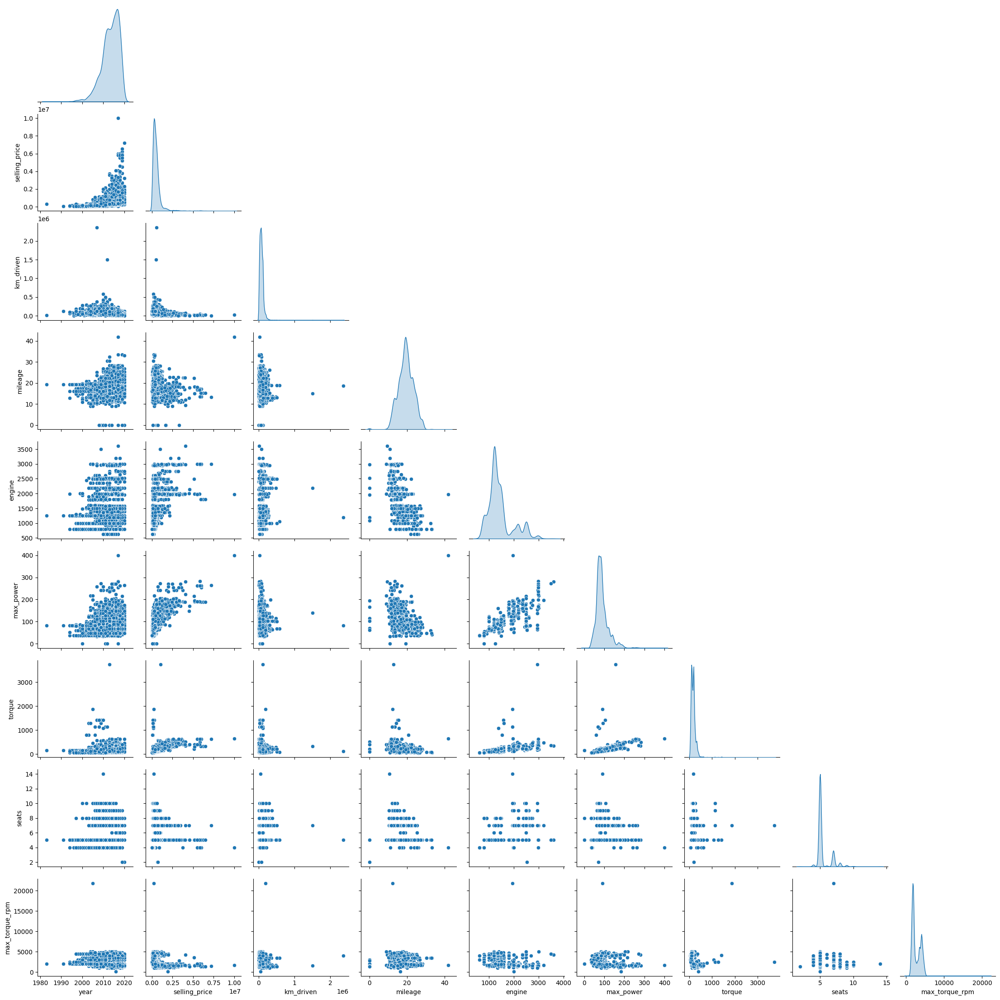

In [28]:


sns.pairplot(df_train.select_dtypes(include=['number']), diag_kind='kde', corner=True)

> Предположить о распределении связи с переменной, конечно, можно, но лучше всегда это подкреплять стат. тестами или иным анализом. Однако можно заметить, что: 
> 1. Экспоненциальный рост цены от года.
> 2. цена в зависимости от пробега, кажется, экспоненциально (либо просто резко) падает и выходит на плато, 
> 3. torque также (за небольшими исключениями) похоже, что линейно зависит от цены
> 4. Максимальная мощность растет вместе с ценой, но рост не линейный и бывают случаи, когда авто с высокой мощностью имеет небольшую стоимость
> 
> По прочим графикам сложно сказать что-то явно сложно

> Касательно корреляции признаков - есть подозрения на корреляцию между максимальной мощностью и двигателем (линейная), torque и engine/max_torque (линейная), а также наблюдается что-то похожее на зависимость между max_torque_rpm и двигателем, макс. мощностью.

Тест:

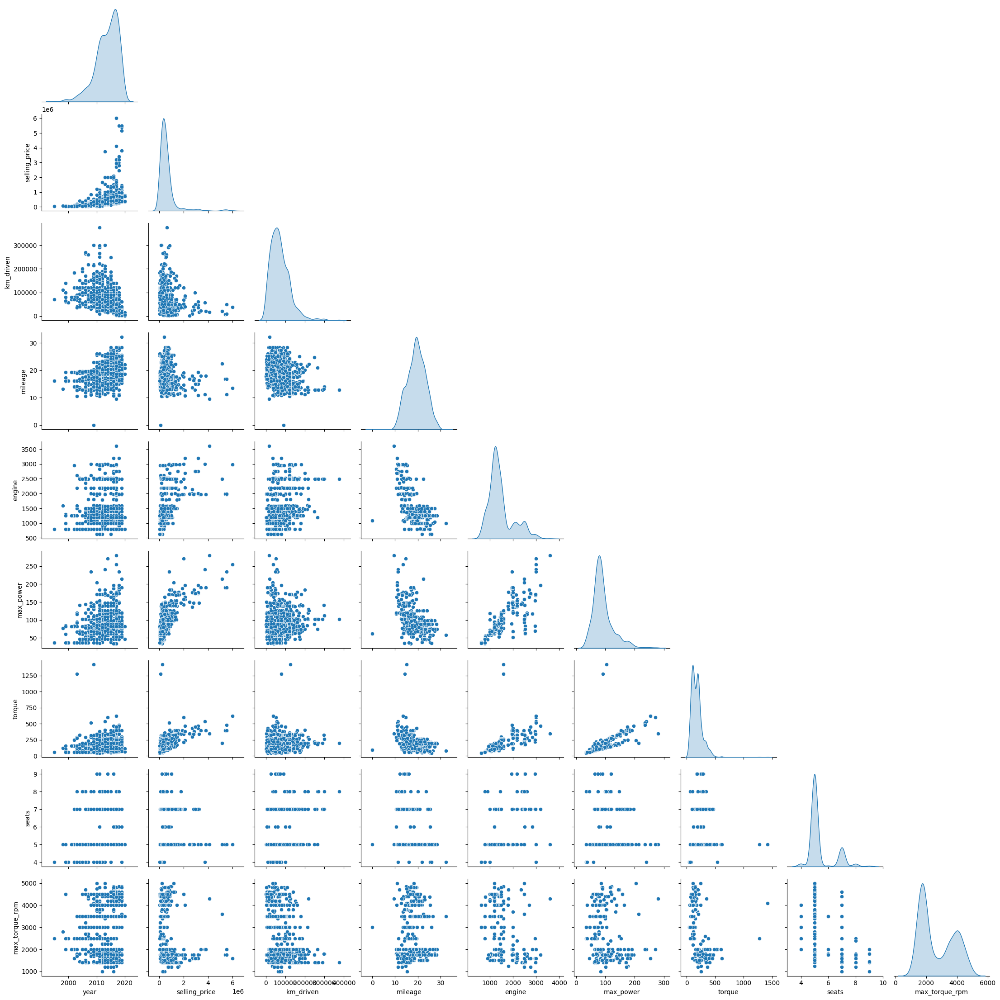

In [29]:

sns.pairplot(df_test.select_dtypes(include=['number']), diag_kind='kde', corner=True)

> В общем распределения (именно самих признаков) похожи, но сильно меняется масштаб у некоторых графиков - можно заметить, что `km_driven` очень сильно сжат в трейне по сравнению с тестом, что может говорить о наличии выбросов.
>
> Можно заметить, что в парных распределениях есть минорные различия (иногда они чуть более явные, как между пробегом и годом выпуска), но в общем и целом распределения похожи.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [30]:
corr = df_train.corr(method="pearson", numeric_only=True)
corr

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.158207,0.048262,0.041178,0.008686
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692725,0.433124,0.149953,-0.241051
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024379,0.106602,0.192328,-0.237227
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.372197,-0.226219,-0.451059,-0.010531
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681247,0.566066,0.652172,-0.474702
max_power,0.158207,0.692725,0.024379,-0.372197,0.681247,1.000000,0.615853,0.242791,-0.256669
torque,0.048262,0.433124,0.106602,-0.226219,0.566066,0.615853,1.000000,0.298097,-0.391872
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.242791,0.298097,1.000000,-0.352853
max_torque_rpm,0.008686,-0.241051,-0.237227,-0.010531,-0.474702,-0.256669,-0.391872,-0.352853,1.000000


In [31]:
corr.round(3)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000,0.427,-0.369,0.341,0.003,0.158,0.048,0.041,0.009
selling_price,0.427,1.000,-0.165,-0.105,0.448,0.693,0.433,0.150,-0.241
km_driven,-0.369,-0.165,1.000,-0.182,0.230,0.024,0.107,0.192,-0.237
mileage,0.341,-0.105,-0.182,1.000,-0.573,-0.372,-0.226,-0.451,-0.011
engine,0.003,0.448,0.230,-0.573,1.000,0.681,0.566,0.652,-0.475
max_power,0.158,0.693,0.024,-0.372,0.681,1.000,0.616,0.243,-0.257
torque,0.048,0.433,0.107,-0.226,0.566,0.616,1.000,0.298,-0.392
seats,0.041,0.150,0.192,-0.451,0.652,0.243,0.298,1.000,-0.353
max_torque_rpm,0.009,-0.241,-0.237,-0.011,-0.475,-0.257,-0.392,-0.353,1.000


<Axes: >

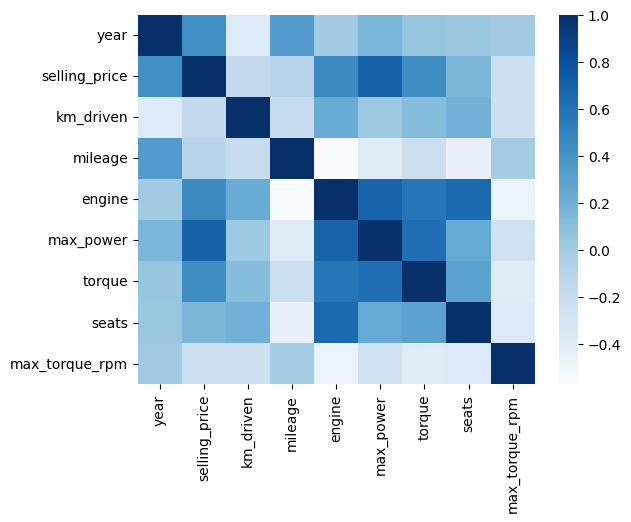

In [32]:
sns.heatmap(corr, cmap="Blues")

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

> - Наименее скоррелированы `engine` и `year` $\approx$ 0.003
> - Наибольшая положительная корреляция наблюдается между $(\text{Признак}_i, \text{Признак}_i)$, $\forall i$ :DDDD
> 
> Помимо этого наибольшая положительная корреляция наблюдается между `max_power` и `selling_price` $\approx$ 0.693
> - Поскольку мы наблюдаем корреляцию -0.369 между `year` и `km_driver`, то утвержение вполне имеет место быть, хотя, конечно, сама сила корреляции (и её стат значимость) требует доп. анализа.
> - По умолчанию в Пандасе используетс корреляция Пирсона - корреляция, измеряющая силу линейной взаимосвязи.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [33]:
# Частично помогал гугл, Gemini и собсвенный анализ для rank функции
def rank(arr: np.ndarray):
    # Получаем кол-ва встреченных значений (отсортированных), индексы для восстановления исходного массива
    _, inverse, counts = np.unique(arr, return_inverse=True, return_counts=True)
    cmax = np.cumsum(counts) # правая граница каждой группы
    cmin = np.zeros_like(cmax)
    cmin[1:] = cmax[:-1] # левая граница каждой группы
    mean_ranks = (cmin + cmax - 1) / 2. # вычисление среднего ранга
    ranks = mean_ranks[inverse] # расстановка рангов по исходным позициям
    return ranks

def spearman_corr(matrix: np.ndarray):
    ranked_arrs = []
    assert len(matrix.shape) == 2, ""
    for arr in matrix.T:
        ranked_arrs.append(rank(arr))
    # Не пользуемся известной формулой, поскольку она предназначена для данных без одинаковых рангов
    # Потому пользуемся корреляцией Спирмена по определению (через Пирсона)
    return np.corrcoef(np.array(ranked_arrs))

    

In [34]:
pandas_corr = df_train.corr("spearman", numeric_only=True)
number_cols = df_train.select_dtypes("number").columns
own_corr = pd.DataFrame(spearman_corr(df_train.select_dtypes("number").values), columns=number_cols, index=number_cols)

In [35]:
pandas_corr

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.166267,0.102603,0.048291,-0.032180
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612600,0.582414,0.317605,-0.366720
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040655,0.242934,0.195317,-0.290415
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308239,-0.162381,-0.435458,0.044445
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713435,0.842430,0.527716,-0.593497
max_power,0.166267,0.612600,0.040655,-0.308239,0.713435,1.000000,0.779424,0.304095,-0.346012
torque,0.102603,0.582414,0.242934,-0.162381,0.842430,0.779424,1.000000,0.438233,-0.746993
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304095,0.438233,1.000000,-0.463293
max_torque_rpm,-0.032180,-0.366720,-0.290415,0.044445,-0.593497,-0.346012,-0.746993,-0.463293,1.000000


In [36]:
own_corr

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.166267,0.102603,0.048291,-0.032180
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612600,0.582414,0.317605,-0.366720
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040655,0.242934,0.195317,-0.290415
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308239,-0.162381,-0.435458,0.044445
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713435,0.842430,0.527716,-0.593497
max_power,0.166267,0.612600,0.040655,-0.308239,0.713435,1.000000,0.779424,0.304095,-0.346012
torque,0.102603,0.582414,0.242934,-0.162381,0.842430,0.779424,1.000000,0.438233,-0.746993
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304095,0.438233,1.000000,-0.463293
max_torque_rpm,-0.032180,-0.366720,-0.290415,0.044445,-0.593497,-0.346012,-0.746993,-0.463293,1.000000


In [37]:
print(
    "Равны ли полученные матрицы?",
    np.allclose(
        own_corr,
        pandas_corr,
    ),
)

Равны ли полученные матрицы? True


phik корреляция:

In [38]:
phik.phik_matrix(df_train)

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


d:\HSE_repos\ai_homeworks\.venv\Lib\site-packages\phik\data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
name,1.000000,0.948995,0.994871,0.000000,1.000000,0.799127,1.000000,0.830098,0.999690,1.000000,0.997908,1.000000,0.999985,0.999942
year,0.948995,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636,0.279253,0.213156,0.388533,0.096307,0.288178,0.158178
selling_price,0.994871,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641,0.649768,0.503682,0.872166,0.423431,0.196447,0.181498
km_driven,0.000000,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887,0.081625,0.210747,0.000000,0.000000,0.096223,0.021597
fuel,1.000000,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943,0.582304,0.644421,0.236798,0.085412,0.450714,0.851704
seller_type,0.799127,0.232412,0.334505,0.000000,0.050771,1.000000,0.127968,0.176612,0.064736,0.160346,0.331959,0.074575,0.032173,0.078712
transmission,1.000000,0.153714,0.463058,0.012824,0.053721,0.127968,1.000000,0.096990,0.331889,0.520161,0.511888,0.404678,0.045734,0.051085
owner,0.830098,0.418636,0.557641,0.087887,0.030943,0.176612,0.096990,1.000000,0.152406,0.186011,0.121828,0.039605,0.046741,0.000000
mileage,0.999690,0.279253,0.649768,0.081625,0.582304,0.064736,0.331889,0.152406,1.000000,0.588155,0.687158,0.204598,0.679979,0.412664
engine,1.000000,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011,0.588155,1.000000,0.721079,0.466097,0.603400,0.640781


> Анализируя график, мы можем заметить множественную корреляцию названии автомобиля и различных показателей - это скорее ошибка, чем какой-либо интерпретируемый результат. У нас действительно одно название автомобиля будет всегда встречаться с одной и той же комбинацией топлива, трансмиссии и иных компонент, которые не меняются в зависимости от комплектации автомобиля.
>
> Мы можем заметить, что phik выдает сильную корреляцию между названием автомобиля и почти всеми прочими признаками - частично, это можно обьяснить тем, что у нас для каждого названия автомобиля будет *почти* всегда одна и та же конфигурация, за исключением, видимо, некоторых модификаций тех же автомобилей. В общем к корреляции названия стоит относиться аккуратно., но в целом это достаточно важный признак, поскольку мы ожидаем, что один и тот же автомобиль будут покупать по цене "в рамках рынка".
>
> Также стоит заметить, что `phik` показывает значимую корреляцию между типом продавца и ценой, однако это может быть ложным сигналов, т.к. мы имеем более половины всех наблюдений со значением `First Owner` + мы имеем очень небольшой количество уникальных наблюдений для `owner` и, возможно, много бинов для `selling_price`, что делает сложным к интерпретации результаты. Заключая, к этой взаимосвязи стоит относиться с особой осторожностью. Аналогично можно сказать и про `transmission`, где у нас всего 2 уникальных значения на множество бинов.
>
> Можно, кстати, заметить, как искажается картина между `selling_price` и `year` в phik и корреляцией Спирмена - 0.219841 и 0.707123 соответственно. Что может свидетельствовать о проблеме разбиения на бины, а потому я более склонен доверять результатам (все также с учетом того, что мы не проверяли стат значимость результатов) корреляции Спирмена, как показателя монотонной зависимости + это подтверждается вышеописанным графиком. Вероятно, между ценой и годом выпуска есть значимая корреляция, которую следует учесть.
>
> Ну и смотря на признаки супер яркой мультиколлинеарности я заметить не смог: конечно, крутящие моменты и макс. значения (`torque` и `max_torque_rpm`) сильно коррелируют с `engine`, но надо будет смотреть на данные и тестировать, помогает ли удаление/сжатие данных или можно их оставить.

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

In [39]:
# your code here

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [40]:
target_col = "selling_price"

In [41]:
y_train = df_train[target_col].copy()
X_train = df_train.drop(columns=target_col).select_dtypes("number").copy() # your code here

In [42]:
X_train.head()

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2014,145500,23.40,1248,74.00,190.000000,5,2000.0
1,2014,120000,21.14,1498,103.52,250.000000,5,1500.0
2,2010,127000,23.00,1396,90.00,219.668960,5,1750.0
3,2007,120000,16.10,1298,88.20,112.776475,5,4500.0
4,2017,45000,20.14,1197,81.86,113.750000,5,4000.0


In [43]:
X_train.shape

(5840, 8)

In [44]:
# assert X_train.shape == (5840, 6)

In [45]:
y_test = df_test[target_col].copy()
X_test = df_test.drop(columns=target_col).select_dtypes("number").copy()

In [46]:
# assert X_test.shape == (1000, 6)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [47]:
model = LinearRegression()
model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [48]:
def estimate_model(model, X_test=X_test, y_true=y_test, predict_func=None):
    _predictions = model.predict(X_test)
    if predict_func is not None:
        _predictions = predict_func(_predictions)
    r2 = r2_score(y_true, _predictions)
    mse = MSE(y_true, _predictions)
    print(f"R2 score: {round(float(r2), 3)}. MSE score: {round(float(mse), 2)}")
    return r2, mse

In [116]:
r2_linear, mse_linear = estimate_model(model)

R2 score: 0.597. MSE score: 231763125380.87


In [50]:
save(model, "base_linear")

In [118]:
print(f"RMSE: {np.sqrt(mse_linear)}")

RMSE: 481417.8282748426


> Можем заметить, что $R^2$ на достаточно высоком уровне (всего на 0.4 меньше максимума), что говорит о хорошем обьяснении дисперсии нашей моделью (или то, что мы лучше бейзлайна "среднего" на 0.6)
>
> Вместо MSE лучше судить об RMSE ~ 481417, при том, что таргет имеет масштаб примерно $10^5$ (по среднему и стандартному отклонению). Таким образом мы не "вылетаем" за масштабы таргета и даже поменьше стандартного отклонения ошибка будет. Интерпетация классическая - "в среднем мы отклоняемся от истинного значения почти на 481417 у.е. при прогнозе".

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

$$
R^2(y, \hat{y})=1 - \frac{\sum_i y_i - \hat{y}_i}{\sum_i y_i - \overline{y}}=1-\frac{(y-\hat{y})^T(y-\hat{y})}{(y-\overline{y})^T(y-\overline{y})}=1-\frac{\Delta_{\hat{y}}^T\Delta_{\hat{y}}}{\Delta_{\overline{y}}^T\Delta_{\overline{y}}}
$$

In [51]:
def r2_score_matrix(y_true: np.ndarray | pd.Series, y_pred: np.ndarray):
    dhat = y_true - y_pred
    doverline = y_true - y_true.mean()
    numerator = dhat.dot(dhat)
    denominator = doverline.dot(doverline)
    r2 = 1 - numerator/denominator 
    return r2

def r2_score_own(y_true: np.ndarray| pd.Series, y_pred: np.ndarray):
    numerator = np.power(y_true - y_pred, 2).sum()
    denominator = np.power(y_true - y_true.mean(), 2).sum()
    r2 = 1 - numerator/denominator
    return r2

In [52]:
y_pred = model.predict(X_test)
r2_sklearn = r2_score(y_test, y_pred)
r2_own_matrix = r2_score_matrix(y_test, y_pred)
r2_own = r2_score_own(y_test, y_pred)

assert abs(r2_sklearn - r2_own_matrix) < 1e-5 and abs(r2_own_matrix - r2_own) < 1e-5, "У вас результаты кривые"

Как мы видим, все вышеописанные имплементации идентичны по результату

In [53]:
%%timeit
r2_own_matrix = r2_score_matrix(y_test, y_pred)

94.4 μs ± 1.06 μs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [54]:
%%timeit
r2_sklearn = r2_score(y_test, y_pred)

167 μs ± 2.43 μs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [55]:
%%timeit
r2_own = r2_score_own(y_test, y_pred)

116 μs ± 1.76 μs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


Вот так вот, пользуйтесь матричной формой и будет вам счастье

> В числителе формулы у нас стоит квадрат ошибки - показатель, представляющи из себя по сути меру ошибки модели. Можно понять, что предикт модели может быть супер точным и тогда квадрат ошибки будет равен нулю. Иначе ошибка бесконечна и квадрат ошибки будет бесконечен.
> 
> В знаменателе у нас стоит дисперсия целевой переменной.
> Итого получаем, что у нас $R^2 \in (-inf; 1]$
>
> Часто ее интерпретируют, как долю обьясненной дисперсии (поскольку в числителе у нас условная дисперсия), однако мне нравится ее вторая интерпретация - насколько наша модель лучше "бейзлайна", где бейзлайн $a(x)=\overline{y}$, модель, истинно предсказывающая среднее таргета. И метрика показывает, а во сколько наша модель лучше бейзлайна. Так $D = \frac{\sum_i y_i - \hat{y}_i}{\sum_i y_i - \overline{y}}$, $\quad R^2=1 | D=0$, что означает, что наша модель на 100% лучше бейзлайна. $R^2 = 0.5 | D=0.5$ => модель имеет ошибку в 2 раза меньше (на 50% лучше) и т.д.

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [56]:
def adjusted_r2(y_true: np.ndarray, y_pred: np.ndarray, n_coefs: int):
    n = len(y_true)
    r2 = r2_score(y_true, y_pred)
    adj_r2 = (1 - r2)*(n-1) / (n - n_coefs - 1)
    return adj_r2

> Adjusted $R^2$ необходимо применять в случаях, когда нам важно штрафовать за кол-во признаков в модели, например, когда:
> 1. Мы делаем выбор между линейными моделями (и у них разное количество параметров).
> 2. Мы оцениваем качество одной и той же модели на разном количестве признаков/параметров.

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [57]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [58]:
model_scaled = LinearRegression()
model_scaled.fit(X_train_scaled, y_train)
estimate_model(model_scaled, X_test_scaled)

R2 score: 0.597. MSE score: 231763125380.87


(0.5968134792408601, 231763125380.86606)

In [59]:
save(scaler, "std_scaler")
save(model_scaled, "linear_scaled")

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [60]:
print("Наиболее информативный признак:", X_train.columns[np.argmax(np.abs(model.coef_))])

Наиболее информативный признак: year


### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [61]:
lasso_model = Lasso()
lasso_model.fit(X_train_scaled, y_train)

,alpha,1.0
,fit_intercept,True
,precompute,False
,copy_X,True
,max_iter,1000
,tol,0.0001
,warm_start,False
,positive,False
,random_state,None
,selection,'cyclic'


In [62]:
estimate_model(lasso_model, X_test_scaled)

R2 score: 0.597. MSE score: 231763825631.79


(0.5968122610499371, 231763825631.7948)

In [63]:
lasso_model.coef_

array([162537.35107368, -49916.84789733,  -4276.75926145,  18280.26285102,
       320587.94142396,   6530.23847881, -31607.98005983, -59984.46614783])

In [64]:
save(lasso_model, "lasso")

> Можем заметить, что L1-регуляризация не занулила ни один признак как минимум по тому, что до этого мы могли видеть далеко ненулевые значений коэффициентов (велики по модулю). Также можно рассуждать, что в силу существования достаточной корреляции каждого признака с таргет переменной, признаки значимы с предсказательной точки зрения. 

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [65]:
%%time

K_FOLDS = KFold(n_splits=10, shuffle=True, random_state=42)
cv_lasso = GridSearchCV(Lasso(random_state=42), {"alpha": np.geomspace(1e-5, 10000, num=200)}, cv=K_FOLDS, scoring="r2")
cv_lasso.fit(X_train_scaled, y_train)

CPU times: total: 4.08 s
Wall time: 4.26 s


,estimator,Lasso(random_state=42)
,param_grid,{'alpha': array([1.0000...00000000e+04])}
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(7316.807143427207)


In [66]:
optimized_lasso = Lasso(random_state=42, **cv_lasso.best_params_).fit(X_train_scaled, y_train)

In [67]:
estimate_model(optimized_lasso, X_test_scaled)

R2 score: 0.587. MSE score: 237196161331.34


(0.5873619029453149, 237196161331.34088)

In [68]:
print("Лучшие параметры для Lasso регрессии:", cv_lasso.best_params_)

Лучшие параметры для Lasso регрессии: {'alpha': np.float64(7316.807143427207)}


In [69]:
print("Лучший скор:", cv_lasso.best_score_)

Лучший скор: 0.5956320971436259


In [70]:
save(optimized_lasso, "optimized_lasso")

> Время обучения дана в ячейке командой `%%time`, в `param_grid` было решено включить только `alpha`, как ключевой параметр регуляризации, отвечающий за коэффициент при регуляризации. `fit_intercept` не трогал, поскольку если это необходимо, то модель может сама занулить его. Модель не стала сильно лучше, но также и не занулила коэффициенты, хоть и `alpha` $\approx$ 7000. И при этом даже на K-Fold он переобучился (`cv_lasso.best_score_` $R^2$ ~ 0.596, а на тесте ~ 0.587). 
> 
> Что говорит о том, что чрезмерная регуляризация вредит модели в вопросе обобщающей способности и даже кросс-валидация не панацея. Модель без регуляризации справилась разительно лучше (см. прошлые $R^2$ значения)

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [71]:
%%time

cv_en = GridSearchCV(ElasticNet(random_state=42), {"alpha": np.geomspace(1e-4, 100, num=40), "l1_ratio": np.linspace(1e-3, 0.99, 20)}, cv=K_FOLDS, scoring="r2")
cv_en.fit(X_train_scaled, y_train)

CPU times: total: 14.6 s
Wall time: 14.9 s


,estimator,ElasticNet(random_state=42)
,param_grid,"{'alpha': array([1.0000...00000000e+02]), 'l1_ratio': array([0.001 ..., 0.99 ])}"
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(0....8826317067413)


In [72]:
elastic = ElasticNet(random_state=42, **cv_en.best_params_).fit(X_train_scaled, y_train)

In [73]:
estimate_model(elastic, X_test_scaled)

R2 score: 0.59. MSE score: 235689418714.16


(0.5899831064370338, 235689418714.16162)

In [74]:
print("Лучшие параметры для ElasticNet регрессии:", cv_en.best_params_)

Лучшие параметры для ElasticNet регрессии: {'alpha': np.float64(0.49238826317067413), 'l1_ratio': np.float64(0.9379473684210526)}


In [75]:
print("Лучший скор:", cv_en.best_score_)

Лучший скор: 0.5953258476321176


In [76]:
save(elastic, "elasticnet")

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [77]:
def powerset(iterable, degree: int):
    "Subsequences of the iterable from shortest to longest."
    # powerset([1,2,3]) → () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)
    s = list(iterable)
    return chain.from_iterable(combinations(s, r) for r in range(degree + 1))


class L0Regression(BaseEstimator, RegressorMixin):
    def __init__(self, degree: int | None = None):
        """ """
        self.degree = degree
        self.selected_indices_ = []
        self.model_ = None
        self.best_score_ = -np.inf

    def fit(self, X, y):
        n_features = X.shape[1]
        _degree = (n_features + self.degree) % n_features
        selected_indices_ = []

        best_score_ = np.inf
        # Жадный алгоритм (Forward Selection)
        for indices_subset in powerset(list(range(n_features)), _degree):
            if not indices_subset:
                continue
            # best_idx_iter = -1
            _X = X[:, indices_subset]
            _linear = LinearRegression()
            _linear.fit(_X, y)
            _score = MSE(y, _linear.predict(_X))
            # Пробуем добавить каждый из оставшихся признаков
            if _score < best_score_:
                best_score_ = _score
                selected_indices_ = indices_subset
        self.selected_indices_ = selected_indices_
        self._best_score = best_score_

        # Финальное обучение модели на выбранных признаках
        self.model_ = LinearRegression()
        self.model_.fit(X[:, self.selected_indices_], y)
        return self

    def predict(self, X):
        if self.model_ is None:
            raise RuntimeError("Model is not fitted")
        # Используем только выбранные признаки
        return self.model_.predict(X[:, self.selected_indices_])
    

In [78]:
cv_l0 = GridSearchCV(L0Regression(), {"degree": [i for i in range(1, X_train_scaled.shape[1])]}, cv=K_FOLDS, scoring="r2")
cv_l0.fit(X_train_scaled, y_train)

,estimator,L0Regression()
,param_grid,"{'degree': [1, 2, ...]}"
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,degree,5


In [79]:
print("Лучшие параметры для L0 регуляризации:", cv_l0.best_params_)

Лучшие параметры для L0 регуляризации: {'degree': 5}


In [80]:
l0_reg = L0Regression(**cv_l0.best_params_).fit(X_train_scaled, y_train)

In [81]:
estimate_model(l0_reg, X_test_scaled)

R2 score: 0.596. MSE score: 232179553404.31


(0.596089040589793, 232179553404.30762)

In [82]:
print("Лучший скор:", cv_l0.best_score_)

Лучший скор: 0.5964267708572945


In [83]:
print("Ненулевые коэффициенты:", np.choose(l0_reg.selected_indices_, X_train.columns).tolist(), f"из {X_train_scaled.shape[1]} признаков")

Ненулевые коэффициенты: ['year', 'km_driven', 'max_power', 'seats', 'max_torque_rpm'] из 8 признаков


In [84]:
save(l0_reg, "l0_reg")

> Обьясню, почему я реализовал именно такую L0 лин. регрессию. Сразу обозначим, что **L0 регуляризация не может быть произведена градиентными методами по определению**, функция индикатора не дифференциируема. Кажется, что применение неградиентных методов (эволюционных алгоритмом и подобных) **выходит за рамки первой дз по ML**, поэтому их тоже отметаем.
>
> Кажется, можно же обучить линейку и после добавить штраф и перебирать, но это просто не имеет смысла - линейная регрессия, обучаясь, **просто не знает** о том, что ей нужно занулять коэффициенты, чтобы уменьшить ошибку. Это как если бы мы наказывали людей за нарушение правила, которое вышло после этого события, пост-фактум.
>
> Тогда идея - а почему бы не занулить коэффициенты сразу при обучении и посмотреть, как изменится ошибка? Модель сразу будет иметь нулевой коэффициент (штраф) и будет пытаться стать лучше за счет других признаков. Поскольку $\hat{y}=x_1w_1 + x_2w_2 + ... + w_nx_n$, то $w_i=0: \hat{y}=x_1w_1 + ... + 0x_i + ... + w_nx_n =x_1w_1 + ... + w_i0 + ... + w_nx_n$, то вместо зануления коэффициентов мы можем занулять признаки. Однако если мы занулим столбец, то можем столкнуться с численной нестабильностью, поэтому лучше просто удалить столбец - это идентичные действия с точки зрения лин. регрессии. 
>
> Однако мы можем занулять разное подмножество фичей, поэтому моим параметром регуляризации $d$ является мощность максимального подмножества фичей. Так, если $d=m$, где $m$ - количество признаков, то модель будет перебирать всевозможные подмножества множества фичей $\hat{F} \subseteq F$, вплоть до $\hat{F} = F$
>
> Можно заметить, что было выбрано только подмножество из 5 фичей, то есть 3 признака (=коэффициента) мы полностью занулили, при этом по $R^2$ мы просели лишь на 0.001, что, вообще говоря, кажется незначимым.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [85]:
def extract_name(df: pd.DataFrame):
    _df = df.copy()
    df["name"] = df["name"].str.split(n=1).str[0]
    return df

cat_columns = df_train.select_dtypes("object").columns.to_list()
cat_columns.append("seats")

num_columns = df_train.select_dtypes("number").columns.to_list()
num_columns.remove("seats")
num_columns.remove("selling_price")

X_train_cat = extract_name(df_train)
y_train = X_train_cat[target_col]
X_train_cat = X_train_cat.drop(columns=target_col)

X_test_cat = extract_name(df_test)
y_test = X_test_cat[target_col]
X_test_cat = X_test_cat.drop(columns=target_col)

X_train_cat[cat_columns] = X_train_cat[cat_columns].astype('category') 
X_test_cat[cat_columns] = X_test_cat[cat_columns].astype('category') 

In [86]:
X_train_cat.describe(include='category')

,name,fuel,seller_type,transmission,owner,seats
count,5840,5840,5840,5840,5840,5840
unique,30,4,3,2,5,9
top,Maruti,Diesel,Individual,Manual,First Owner,5
freq,1804,3177,5223,5336,3603,4618


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [87]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_columns),
        ('cat', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), cat_columns)
    ],
    verbose_feature_names_out=False,
    remainder='drop'
)

preprocessor.set_output(transform="pandas")
X_train_cat = preprocessor.fit_transform(X_train_cat)
X_test_cat = preprocessor.transform(X_test_cat)

d:\HSE_repos\ai_homeworks\.venv\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [88]:
save(preprocessor, "base_preprocessor")

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

> - Необходимо, чтобы количество уникальных категорий было не слишком большим, поскольку иначе размерность выходного вектора будет чрезвычайно большой.
> - Удалять столбец необходимо с целью предотвращения мультиколлинеарности в случае линейной модели со свободным членом.
> - Удалять в случае, если вес признака значимо близок к нулю, допустимо (поскольку модель сама по себе не делала разницы между дропнутым признаком и признаком с маленьким весом), но в таком случае мы теряем также интерпретируемость результатов - мы обьединяем $k + 1$ признаков в один (дропнутый).

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [89]:
cv_r = GridSearchCV(Ridge(random_state=42), {"alpha": np.geomspace(1e-4, 100, num=40)}, cv=K_FOLDS, scoring="r2")
cv_r.fit(X_train_cat, y_train)

,estimator,Ridge(random_state=42)
,param_grid,{'alpha': array([1.0000...00000000e+02])}
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(0.701703828670383)


In [90]:
print("Лучшие параметры Ridge регрессии:", cv_r.best_params_)

Лучшие параметры Ridge регрессии: {'alpha': np.float64(0.701703828670383)}


In [91]:
ridge_cat = Ridge(random_state=42, **cv_r.best_params_).fit(X_train_cat, y_train)

In [92]:
estimate_model(ridge_cat, X_test_cat, y_test)

R2 score: 0.783. MSE score: 124531269072.68


(0.7833592853883696, 124531269072.6839)

In [93]:
print("Минимальный абсолютный вес:", sorted(np.abs(ridge_cat.coef_))[0])

Минимальный абсолютный вес: 595.0286150512949


In [94]:
save(ridge_cat, "ridge_categorical")

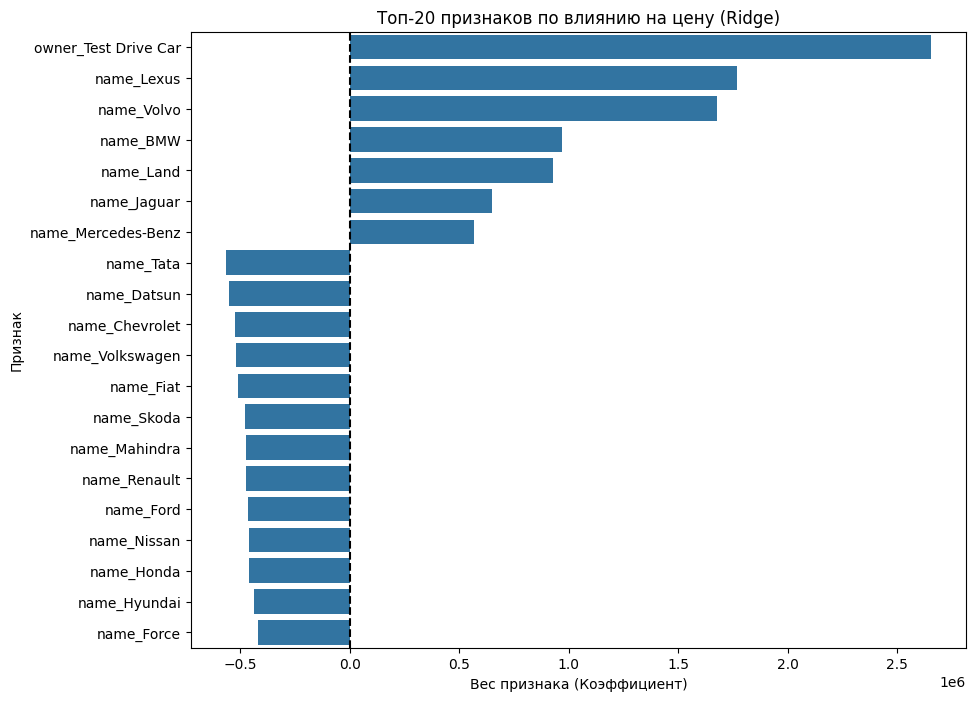

In [95]:
feature_importance = pd.DataFrame({
    'feature': X_train_cat.columns,
    'coef': ridge_cat.coef_,
    'abs_coef': abs(ridge_cat.coef_)
})

# 2. Сортируем по абсолютной важности
feature_importance = feature_importance.sort_values(by='abs_coef', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(data=feature_importance.head(20), x='coef', y='feature')
plt.title("Топ-20 признаков по влиянию на цену (Ridge)")
plt.xlabel("Вес признака (Коэффициент)")
plt.ylabel("Признак")
plt.axvline(x=0, color='black', linestyle='--')
plt.show()

> Уже имеем очень хороший показатель $R^2$, это радует - качество улучшилось! Однако признаки не обнулились.

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [96]:
cat_columns = df_train.select_dtypes("object").columns.to_list()

In [97]:
# Частично в выборе фичей и реализации обогащателя (:D) участвовал Gemini 3 Pro
class FeatureEnrichment(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.max_year = X['year'].max()
        return self
    
    def transform(self, X, y=None):
        X_copy = X.copy()
        
        # Используем макс год из данных для определения возраста авто
        if 'year' in X_copy.columns:
            max_year = self.max_year
            X_copy['age'] = max_year - X_copy['year']
        
        # 3. Признаки эффективности
        if 'engine' in X_copy.columns and 'max_power' in X_copy.columns:
            # +1e-5 защита от деления на ноль
            X_copy['power_per_liter'] = X_copy['max_power'] / (X_copy['engine'] + 1e-5)
            
        if 'km_driven' in X_copy.columns and 'age' in X_copy.columns:
            X_copy['km_per_year'] = X_copy['km_driven'] / (X_copy['age'] + 1)
        
        return X_copy
    
num_features = ['year', 'km_driven', 'engine', 'max_power', 'seats', 'mileage', 
                'age', 'power_per_liter', 'km_per_year']


num_pipeline = Pipeline([
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_pipeline, num_features),
        ('cat', cat_pipeline, cat_columns)
    ],
    verbose_feature_names_out=False
)
preprocessor.set_output(transform="pandas")

data_pipeline = Pipeline([
    ('fe', FeatureEnrichment()),
    ('prep', preprocessor)
])


In [98]:
X_train_cat_new = extract_name(df_train)
y_train = X_train_cat_new[target_col]
X_train_cat_new = X_train_cat_new.drop(columns=target_col)

X_test_cat_new = extract_name(df_test)
y_test = X_test_cat_new[target_col]
X_test_cat_new = X_test_cat_new.drop(columns=target_col)

X_train_cat_new[cat_columns] = X_train_cat_new[cat_columns].astype('category') 
X_test_cat_new[cat_columns] = X_test_cat_new[cat_columns].astype('category') 

In [99]:
X_train_final = data_pipeline.fit_transform(X_train_cat_new)
X_test_final = data_pipeline.transform(X_test_cat_new)

d:\HSE_repos\ai_homeworks\.venv\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [100]:
save(data_pipeline, "data_pipeline")

In [101]:
cv_l = GridSearchCV(Ridge(random_state=42), {"alpha": np.geomspace(1e-4, 100, num=40)}, cv=K_FOLDS, scoring="r2")
cv_l.fit(X_train_final, np.log(y_train))

,estimator,Ridge(random_state=42)
,param_grid,{'alpha': array([1.0000...00000000e+02])}
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(2.030917620904739)


In [102]:
print(f"Лучшие параметры модели {cv_l.best_params_} с R2 score: {round(cv_l.best_score_, 3)}")

Лучшие параметры модели {'alpha': np.float64(2.030917620904739)} с R2 score: 0.895


In [103]:
ridge_final = Ridge(random_state=42, **cv_l.best_params_).fit(X_train_final, np.log(y_train))

In [104]:
estimate_model(ridge_final, X_test_final, y_test, predict_func=np.exp) # Проверяем предикт с восстановленным таргетом

R2 score: 0.935. MSE score: 37324204403.36


(0.9350689800684951, 37324204403.35797)

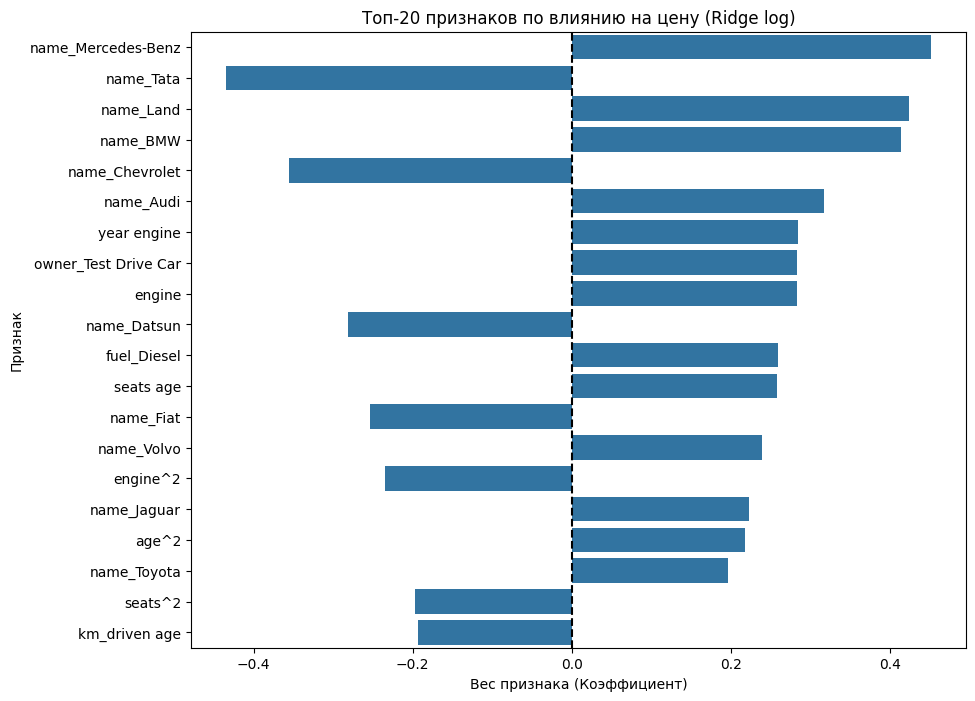

In [105]:
feature_importance = pd.DataFrame({
    'feature': X_train_final.columns,
    'coef': ridge_final.coef_,
    'abs_coef': abs(ridge_final.coef_)
})

# 2. Сортируем по абсолютной важности
feature_importance = feature_importance.sort_values(by='abs_coef', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(data=feature_importance.head(20), x='coef', y='feature')
plt.title("Топ-20 признаков по влиянию на цену (Ridge log)")
plt.xlabel("Вес признака (Коэффициент)")
plt.ylabel("Признак")
plt.axvline(x=0, color='black', linestyle='--')
plt.show()

In [106]:
save(ridge_final, "ridge_log")

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [107]:
def business_metrics(y_true, y_pred):
    mape = np.abs((y_true - y_pred) / (y_true + 1e-5))
    metric = (mape <= 0.1).mean()
    return metric

In [108]:
models = {
    # Базовая линейная (из начала)
    "Base linear": (model, X_test), 
    
    "Scaled linear": (model, X_test_scaled),
    
    "Base lasso": (lasso_model, X_test_scaled),
    # Lasso (оптимизированная)
    "Optimized Lasso": (optimized_lasso, X_test_scaled),
    
    # ElasticNet
    "ElasticNet": (elastic, X_test_scaled),
    
    # L0 (ваша кастомная реализация)
    "L0 Regression": (l0_reg, X_test_scaled),
    
    # Ridge на категориальных данных (из задания 22)
    "Ridge (Categorical)": (ridge_cat, X_test_cat),
    
    # Ridge Bonus (Финальная, с Feature Eng и Log-таргетом)
    "Ridge (Log Target)": (ridge_final, X_test_final) 
}

def get_best_by_metric(metric, models):
    results = []

    for name, (clf, dataset) in models.items():
        try:
            preds = clf.predict(dataset)
            
            # Если модель обучалась на лог таргете, то необходимо вернуть экспоненту
            if name == "Ridge (Log Target)":
                preds = np.exp(preds)
            
            score = metric(y_test, preds)
            
            results.append((name, score))
        except Exception as e:
            print(f"Ошибка с моделью {name}: {e}")
    return results

results_buisness = get_best_by_metric(business_metrics, models)

d:\HSE_repos\ai_homeworks\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [109]:
names, scores = zip(*results_buisness)
best_result_index = np.argmax(scores)
print(f"Лучшая модель {names[best_result_index]} с результатом: {float(scores[best_result_index])}")

Лучшая модель Ridge (Log Target) с результатом: 0.367


> Можем заметить, что бизнес метрика лучшая у модели с лучшим показателем $R^2$.

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



> Функционал асимметричного штрафа $F(y, \hat{y})=|y - \hat{y}| * \big[\space(1 + \alpha) \mathbf{I}[\hat{y} < y] + (1 - \beta) \mathbf{I}[\hat{y} > y]\space\big]$, где $\mathbf{I}$ - функция индикатора, а $\alpha, \beta$ - коэффициенты важности, которые на долю увеличивают ошибку недопрогноза и уменьшают ошибку перепрогноза соответственно каждый.
>
> Таким образом мы получаем интерпретируемую метрику, где бизнес может явно задать, насколько для нас важна единица потери в перепрогнозе/недопрогнозе относительно базовых единиц. Т.е. выставляя коэффициент $\alpha=1$ мы каждую единицу потери недопрогноза считаем как 2 (например, в единицу зашиваются еще и расходы на логистику/иные вещи)

In [111]:
def your_business_metrics(y_true, y_pred, alpha=0.3, beta=0.3):
    metric = np.where(y_true - y_pred > 0, (y_true - y_pred) * (1 + alpha), (y_pred - y_true) * (1 - beta)).mean()
    return metric

Проверим корректность метрики:

In [112]:
# Ячейка сгенерирована полностью Gemini 3 Pro и проверена мной

y_true_ideal = np.array([100, 200])
y_pred_ideal = np.array([100, 200])
print(f"Идеал (должно быть 0): {your_business_metrics(y_true_ideal, y_pred_ideal):.2f}")

# 2. Недопрогноз (ПЛОХО)
y_true_under = np.array([100, 120])
y_pred_under = np.array([80, 80])
score_under = your_business_metrics(y_true_under, y_pred_under)
print(f"Недопрогноз: {score_under:.2f}")

# 3. Перепрогноз (ЛУЧШЕ)
y_true_over = np.array([100, 80])
y_pred_over = np.array([120, 120])
score_over = your_business_metrics(y_true_over, y_pred_over)
print(f"Перепрогноз: {score_over:.2f}")

# Проверка
if score_under > score_over:
    print("✅ УСПЕХ: Недопрогноз наказывается сильнее!")
else:
    print("❌ ОШИБКА: Метрика работает неправильно.")

Идеал (должно быть 0): 0.00
Недопрогноз: 39.00
Перепрогноз: 21.00
✅ УСПЕХ: Недопрогноз наказывается сильнее!


In [113]:
results_own_metric = get_best_by_metric(partial(your_business_metrics, alpha=0.15, beta=0.15), models)

d:\HSE_repos\ai_homeworks\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [114]:
names, scores = zip(*results_own_metric)
best_result_index = np.argmin(scores)
print(f"Лучшая модель {names[best_result_index]} с результатом: {float(scores[best_result_index])}")

Лучшая модель Ridge (Log Target) с результатом: 103558.6293382878


# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 25**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Далее в этот же репозиторий вы прикрепите вторую часть. Под результатами первой части понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)